In [ ]:
# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Path to your zip file in Google Drive
zip_path = '/content/drive/MyDrive/Alzheimer zip/archive (5).zip'

# Destination directory to extract the dataset
extracted_path = '/content/dataset'

# Extract the zip file
import zipfile
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_path)

# Now your dataset is extracted in 'extracted_path' directory
# You can access the images from this directory

# Example of how to access the images:
import os
# List the contents of the directory
dataset_files = os.listdir(extracted_path)
print(dataset_files)

# Now you can work with the images in the dataset_files list


Mounted at /content/drive
['Alzheimer_s Dataset']


In [ ]:
import os
import zipfile
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray

# Mount Google Drive
from google.colab import drive
drive.mount('/content/drive')

# Path to your zip file in Google Drive
zip_path = '/content/drive/MyDrive/Alzheimer zip/archive (5).zip'

# Destination directory to extract the dataset
extracted_path = '/content/Alzheimer_dataset'

# Extract the zip file
with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extracted_path)

# Directory paths for train and test data
train_data_dir = os.path.join(extracted_path, 'Alzheimer_s Dataset', 'train')
test_data_dir = os.path.join(extracted_path, 'Alzheimer_s Dataset', 'test')

# Function to load and convert images to grayscale if necessary
def load_images_from_folder(folder):
    images = []
    for filename in os.listdir(folder):
        img = imread(os.path.join(folder, filename))
        if img is not None:
            if len(img.shape) == 3:  # If the image has 3 channels (RGB)
                gray_img = rgb2gray(img)
            else:  # Image is already grayscale
                gray_img = img
            images.append(gray_img)
    return np.array(images)

# Load train images
train_images = []
train_labels = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_images_from_folder(class_path)
        train_images.extend(images)
        train_labels.extend([class_folder] * len(images))

# Load test images
test_images = []
test_labels = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_images_from_folder(class_path)
        test_images.extend(images)
        test_labels.extend([class_folder] * len(images))

# Convert lists to numpy arrays
train_images = np.array(train_images)
train_labels = np.array(train_labels)
test_images = np.array(test_images)
test_labels = np.array(test_labels)

# Reshape images for logistic regression (flatten)
train_images_flat = train_images.reshape(train_images.shape[0], -1)
test_images_flat = test_images.reshape(test_images.shape[0], -1)

# Check the shape of the data
print("Train images shape:", train_images_flat.shape)
print("Train labels shape:", train_labels.shape)
print("Test images shape:", test_images_flat.shape)
print("Test labels shape:", test_labels.shape)


Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).
Train images shape: (5121, 36608)
Train labels shape: (5121,)
Test images shape: (1279, 36608)
Test labels shape: (1279,)


In [ ]:
import os
import zipfile
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import gaussian
from scipy.ndimage import median_filter


# Function to load, convert to grayscale, and apply noise reduction
def load_and_filter_images_from_folder(folder, use_gaussian=True):
    images = []
    for filename in os.listdir(folder):
        img = imread(os.path.join(folder, filename))
        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Apply noise reduction filtering
            if use_gaussian:
                filtered_img = gaussian(gray_img, sigma=1)  # Gaussian filtering
            else:
                filtered_img = median_filter(gray_img, size=3)  # Median filtering

            images.append(filtered_img)
    return np.array(images)

# Load and filter train images with Gaussian filtering
train_images_gaussian = []
train_labels_gaussian = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_and_filter_images_from_folder(class_path, use_gaussian=True)
        train_images_gaussian.extend(images)
        train_labels_gaussian.extend([class_folder] * len(images))

# Load and filter test images with Median filtering
test_images_median = []
test_labels_median = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_and_filter_images_from_folder(class_path, use_gaussian=False)
        test_images_median.extend(images)
        test_labels_median.extend([class_folder] * len(images))

# Convert lists to numpy arrays
train_images_gaussian = np.array(train_images_gaussian)
train_labels_gaussian = np.array(train_labels_gaussian)
test_images_median = np.array(test_images_median)
test_labels_median = np.array(test_labels_median)

# Reshape images for logistic regression (flatten)
train_images_flat_gaussian = train_images_gaussian.reshape(train_images_gaussian.shape[0], -1)
test_images_flat_median = test_images_median.reshape(test_images_median.shape[0], -1)

# Check the shape of the data
print("Train images shape after Gaussian filtering:", train_images_flat_gaussian.shape)
print("Train labels shape:", train_labels_gaussian.shape)
print("Test images shape after Median filtering:", test_images_flat_median.shape)
print("Test labels shape:", test_labels_median.shape)


Train images shape after Gaussian filtering: (5121, 36608)
Train labels shape: (5121,)
Test images shape after Median filtering: (1279, 36608)
Test labels shape: (1279,)


In [ ]:
import os
import numpy as np
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation, opening, closing, square

# Function to load, convert to grayscale, binarize, and apply morphological operations
def load_and_process_images_from_folder(folder, morph_operation=None):
    images = []
    for filename in os.listdir(folder):
        img = imread(os.path.join(folder, filename))
        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Binarization using Otsu's threshold
            thresh = threshold_otsu(gray_img)
            binary_img = gray_img > thresh

            # Apply morphological operation
            if morph_operation == 'erosion':
                processed_img = erosion(binary_img, square(3))
            elif morph_operation == 'dilation':
                processed_img = dilation(binary_img, square(3))
            elif morph_operation == 'opening':
                processed_img = opening(binary_img, square(3))
            elif morph_operation == 'closing':
                processed_img = closing(binary_img, square(3))
            else:
                processed_img = binary_img  # No morphological operation

            images.append(processed_img)
    return np.array(images)

# Example usage:

# Apply binarization and opening operation on training images
train_images_binarized_opening = []
train_labels_binarized_opening = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_and_process_images_from_folder(class_path, morph_operation='opening')
        train_images_binarized_opening.extend(images)
        train_labels_binarized_opening.extend([class_folder] * len(images))

# Apply binarization and closing operation on test images
test_images_binarized_closing = []
test_labels_binarized_closing = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_and_process_images_from_folder(class_path, morph_operation='closing')
        test_images_binarized_closing.extend(images)
        test_labels_binarized_closing.extend([class_folder] * len(images))

# Convert lists to numpy arrays
train_images_binarized_opening = np.array(train_images_binarized_opening)
train_labels_binarized_opening = np.array(train_labels_binarized_opening)
test_images_binarized_closing = np.array(test_images_binarized_closing)
test_labels_binarized_closing = np.array(test_labels_binarized_closing)

# Check the shape of the processed data
print("Train images shape after binarization and opening:", train_images_binarized_opening.shape)
print("Train labels shape:", train_labels_binarized_opening.shape)
print("Test images shape after binarization and closing:", test_images_binarized_closing.shape)
print("Test labels shape:", test_labels_binarized_closing.shape)


Train images shape after binarization and opening: (5121, 208, 176)
Train labels shape: (5121,)
Test images shape after binarization and closing: (1279, 208, 176)
Test labels shape: (1279,)


In [ ]:
import os
import numpy as np
import cv2
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation, opening, closing, square

# Function to load, convert to grayscale, binarize, apply morphological operations, and then apply Otsu's thresholding
def load_and_segment_images_from_folder(folder, morph_operation=None):
    segmented_images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = imread(img_path)

        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Binarization using Otsu's threshold (skimage)
            thresh = threshold_otsu(gray_img)
            binary_img = gray_img > thresh

            # Apply morphological operation (using skimage)
            if morph_operation == 'erosion':
                processed_img = erosion(binary_img, square(3))
            elif morph_operation == 'dilation':
                processed_img = dilation(binary_img, square(3))
            elif morph_operation == 'opening':
                processed_img = opening(binary_img, square(3))
            elif morph_operation == 'closing':
                processed_img = closing(binary_img, square(3))
            else:
                processed_img = binary_img  # No morphological operation

            # Convert processed image back to uint8 for OpenCV
            processed_img_uint8 = (processed_img * 255).astype(np.uint8)

            # Apply Otsu's thresholding using OpenCV
            _, thresh_image = cv2.threshold(processed_img_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            segmented_images.append(thresh_image)
    return np.array(segmented_images)

# Example usage:

# Apply segmentation on training images
train_images_segmented = []
train_labels_segmented = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_and_segment_images_from_folder(class_path, morph_operation='opening')
        train_images_segmented.extend(images)
        train_labels_segmented.extend([class_folder] * len(images))

# Apply segmentation on test images
test_images_segmented = []
test_labels_segmented = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        images = load_and_segment_images_from_folder(class_path, morph_operation='closing')
        test_images_segmented.extend(images)
        test_labels_segmented.extend([class_folder] * len(images))

# Convert lists to numpy arrays
train_images_segmented = np.array(train_images_segmented)
train_labels_segmented = np.array(train_labels_segmented)
test_images_segmented = np.array(test_images_segmented)
test_labels_segmented = np.array(test_labels_segmented)

# Check the shape of the processed data
print("Train images shape after segmentation:", train_images_segmented.shape)
print("Train labels shape:", train_labels_segmented.shape)
print("Test images shape after segmentation:", test_images_segmented.shape)
print("Test labels shape:", test_labels_segmented.shape)


Train images shape after segmentation: (5121, 208, 176)
Train labels shape: (5121,)
Test images shape after segmentation: (1279, 208, 176)
Test labels shape: (1279,)


Train images shape after segmentation: (5121, 208, 176)
Train labels shape: (5121,)
Test images shape after segmentation: (1279, 208, 176)
Test labels shape: (1279,)


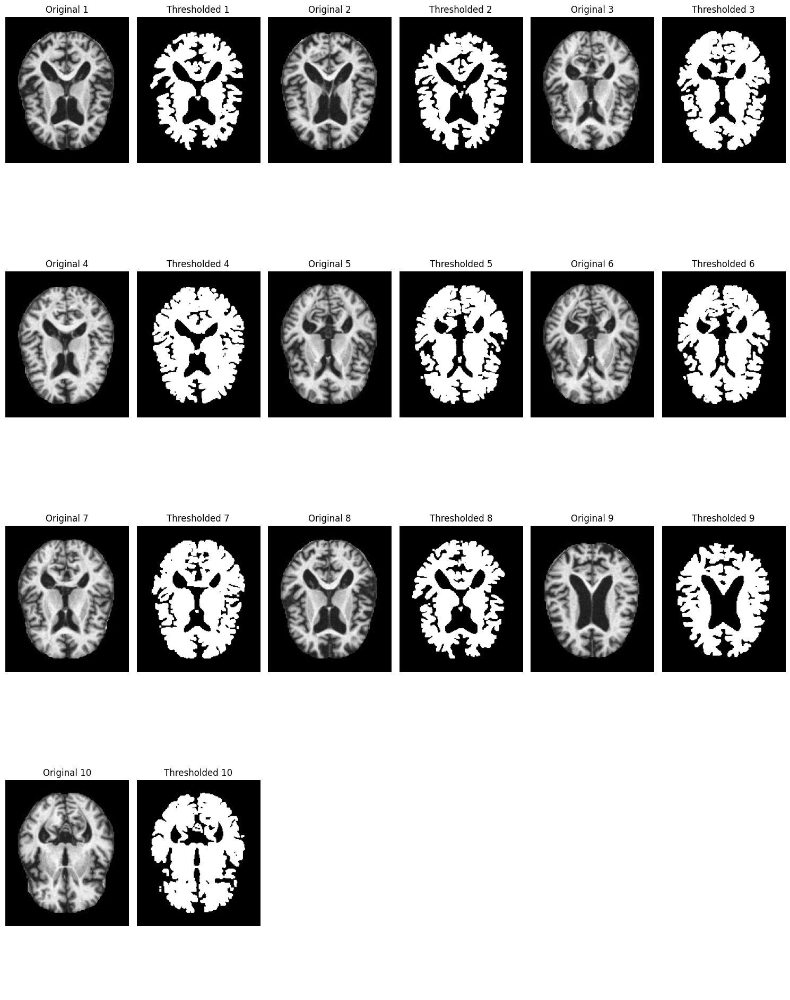

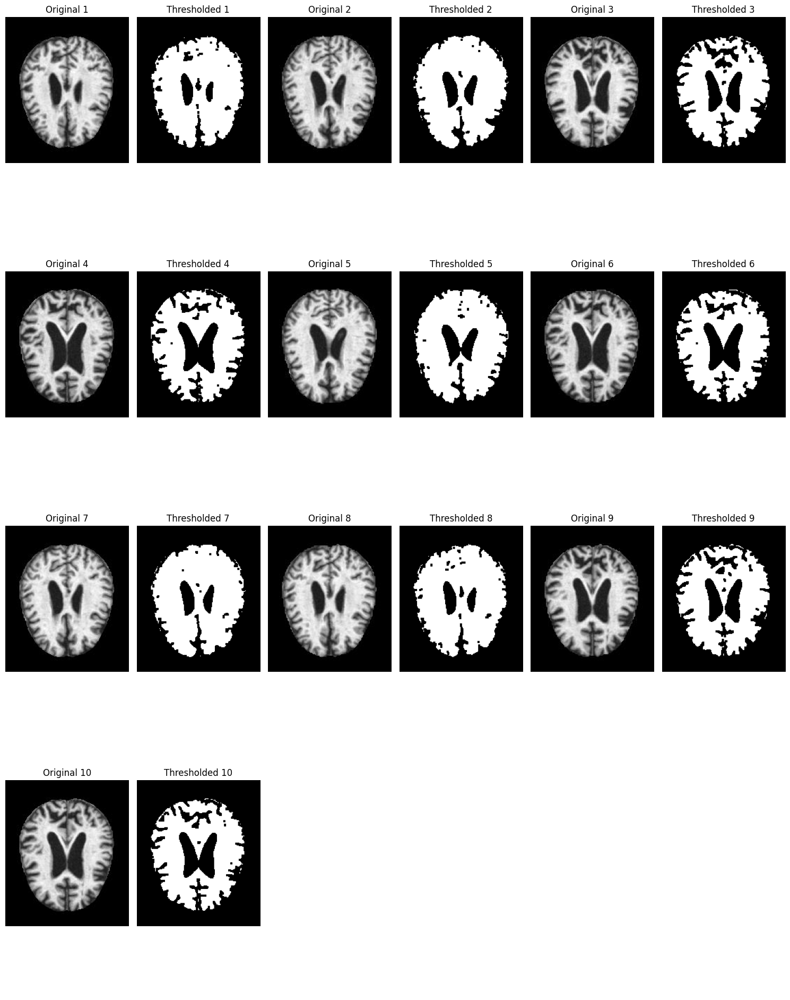

In [ ]:
#thresholding after morphological

import os
import numpy as np
import cv2
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation, opening, closing, square
import matplotlib.pyplot as plt

# Function to load, convert to grayscale, binarize, apply morphological operations, and then apply Otsu's thresholding
def load_and_segment_images_from_folder(folder, morph_operation=None):
    original_images = []
    segmented_images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = imread(img_path)

        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Binarization using Otsu's threshold (skimage)
            thresh = threshold_otsu(gray_img)
            binary_img = gray_img > thresh

            # Apply morphological operation (using skimage)
            if morph_operation == 'erosion':
                processed_img = erosion(binary_img, square(3))
            elif morph_operation == 'dilation':
                processed_img = dilation(binary_img, square(3))
            elif morph_operation == 'opening':
                processed_img = opening(binary_img, square(3))
            elif morph_operation == 'closing':
                processed_img = closing(binary_img, square(3))
            else:
                processed_img = binary_img  # No morphological operation

            # Convert processed image back to uint8 for OpenCV
            processed_img_uint8 = (processed_img * 255).astype(np.uint8)

            # Apply Otsu's thresholding using OpenCV
            _, thresh_image = cv2.threshold(processed_img_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            original_images.append(gray_img)  # Store original grayscale image
            segmented_images.append(thresh_image)
    return np.array(original_images), np.array(segmented_images)

# Function to display images with original and thresholded versions
def display_images_with_threshold(original_images, thresholded_images, ncols=3, max_images=10):
    """ Display a limited number of original and thresholded images in a grid with titles. """
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(original_images[i], cmap='gray')
        axs[2 * i].set_title(f"Original {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(thresholded_images[i], cmap='gray')
        axs[2 * i + 1].set_title(f"Thresholded {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * i + 2, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Define directories
train_data_dir = '/content/dataset/Alzheimer_s Dataset/train'  # Replace with your path
test_data_dir = '/content/dataset/Alzheimer_s Dataset/test'    # Replace with your path

# Apply segmentation on training images
train_images_segmented = []
train_labels_segmented = []
original_train_images = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images = load_and_segment_images_from_folder(class_path, morph_operation='opening')
        original_train_images.extend(original_images)
        train_images_segmented.extend(segmented_images)
        train_labels_segmented.extend([class_folder] * len(segmented_images))

# Apply segmentation on test images
test_images_segmented = []
test_labels_segmented = []
original_test_images = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images = load_and_segment_images_from_folder(class_path, morph_operation='closing')
        original_test_images.extend(original_images)
        test_images_segmented.extend(segmented_images)
        test_labels_segmented.extend([class_folder] * len(segmented_images))

# Convert lists to numpy arrays
original_train_images = np.array(original_train_images)
train_images_segmented = np.array(train_images_segmented)
train_labels_segmented = np.array(train_labels_segmented)

original_test_images = np.array(original_test_images)
test_images_segmented = np.array(test_images_segmented)
test_labels_segmented = np.array(test_labels_segmented)

# Check the shape of the processed data
print("Train images shape after segmentation:", train_images_segmented.shape)
print("Train labels shape:", train_labels_segmented.shape)
print("Test images shape after segmentation:", test_images_segmented.shape)
print("Test labels shape:", test_labels_segmented.shape)

# Display a limited number of original and thresholded training images
display_images_with_threshold(original_train_images, train_images_segmented, ncols=3, max_images=10)

# Display a limited number of original and thresholded test images
display_images_with_threshold(original_test_images, test_images_segmented, ncols=3, max_images=10)


Train images shape after segmentation: (5121, 208, 176)
Train labels shape: (5121,)
Test images shape after segmentation: (1279, 208, 176)
Test labels shape: (1279,)


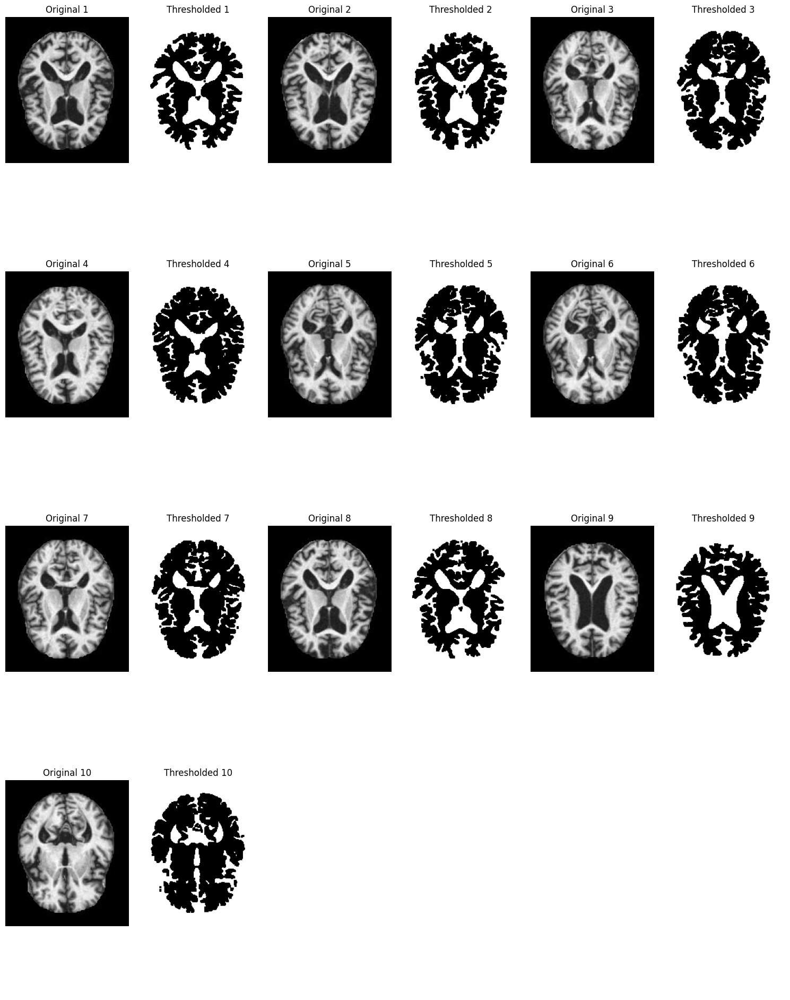

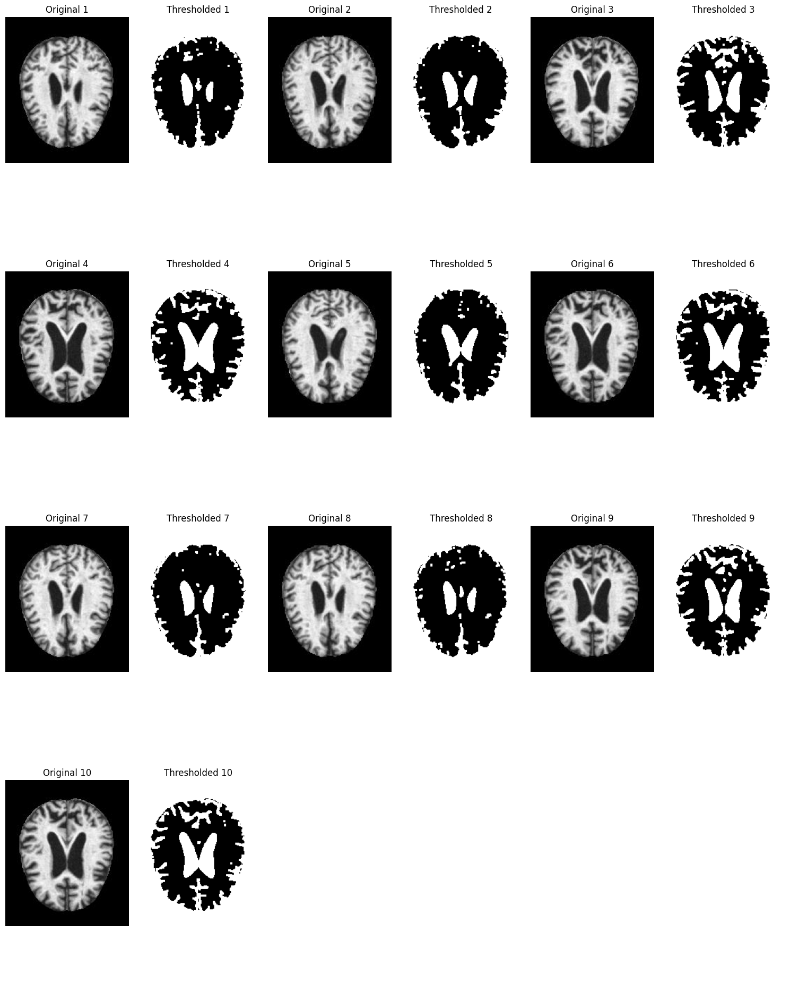

In [ ]:
#complement after thresholding

import os
import numpy as np
import cv2
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation, opening, closing, square
import matplotlib.pyplot as plt

# Function to load, convert to grayscale, binarize, apply morphological operations, and then apply Otsu's thresholding
def load_and_segment_images_from_folder(folder, morph_operation=None, complement=False):
    original_images = []
    segmented_images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = imread(img_path)

        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Binarization using Otsu's threshold (skimage)
            thresh = threshold_otsu(gray_img)
            binary_img = gray_img > thresh

            # Apply morphological operation (using skimage)
            if morph_operation == 'erosion':
                processed_img = erosion(binary_img, square(3))
            elif morph_operation == 'dilation':
                processed_img = dilation(binary_img, square(3))
            elif morph_operation == 'opening':
                processed_img = opening(binary_img, square(3))
            elif morph_operation == 'closing':
                processed_img = closing(binary_img, square(3))
            else:
                processed_img = binary_img  # No morphological operation

            # Convert processed image back to uint8 for OpenCV
            processed_img_uint8 = (processed_img * 255).astype(np.uint8)

            # Apply Otsu's thresholding using OpenCV
            _, thresh_image = cv2.threshold(processed_img_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Complement the thresholded image
            if complement:
                thresh_image = cv2.bitwise_not(thresh_image)

            original_images.append(gray_img)  # Store original grayscale image
            segmented_images.append(thresh_image)
    return np.array(original_images), np.array(segmented_images)

# Function to display images with original and thresholded versions
def display_images_with_threshold(original_images, thresholded_images, ncols=3, max_images=10):
    """ Display a limited number of original and thresholded images in a grid with titles. """
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(original_images[i], cmap='gray')
        axs[2 * i].set_title(f"Original {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(thresholded_images[i], cmap='gray')
        axs[2 * i + 1].set_title(f"Thresholded {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * i + 2, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Define directories
train_data_dir = '/content/dataset/Alzheimer_s Dataset/train'  # Replace with your path
test_data_dir = '/content/dataset/Alzheimer_s Dataset/test'    # Replace with your path

# Apply segmentation on training images
train_images_segmented = []
train_labels_segmented = []
original_train_images = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images = load_and_segment_images_from_folder(class_path, morph_operation='opening', complement=True)
        original_train_images.extend(original_images)
        train_images_segmented.extend(segmented_images)
        train_labels_segmented.extend([class_folder] * len(segmented_images))

# Apply segmentation on test images
test_images_segmented = []
test_labels_segmented = []
original_test_images = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images = load_and_segment_images_from_folder(class_path, morph_operation='closing', complement=True)
        original_test_images.extend(original_images)
        test_images_segmented.extend(segmented_images)
        test_labels_segmented.extend([class_folder] * len(segmented_images))

# Convert lists to numpy arrays
original_train_images = np.array(original_train_images)
train_images_segmented = np.array(train_images_segmented)
train_labels_segmented = np.array(train_labels_segmented)

original_test_images = np.array(original_test_images)
test_images_segmented = np.array(test_images_segmented)
test_labels_segmented = np.array(test_labels_segmented)

# Check the shape of the processed data
print("Train images shape after segmentation:", train_images_segmented.shape)
print("Train labels shape:", train_labels_segmented.shape)
print("Test images shape after segmentation:", test_images_segmented.shape)
print("Test labels shape:", test_labels_segmented.shape)

# Display a limited number of original and thresholded training images
display_images_with_threshold(original_train_images, train_images_segmented, ncols=3, max_images=10)

# Display a limited number of original and thresholded test images
display_images_with_threshold(original_test_images, test_images_segmented, ncols=3, max_images=10)


Train images shape after segmentation: (5121, 208, 176)
Train labels shape: (5121,)
Test images shape after segmentation: (1279, 208, 176)
Test labels shape: (1279,)


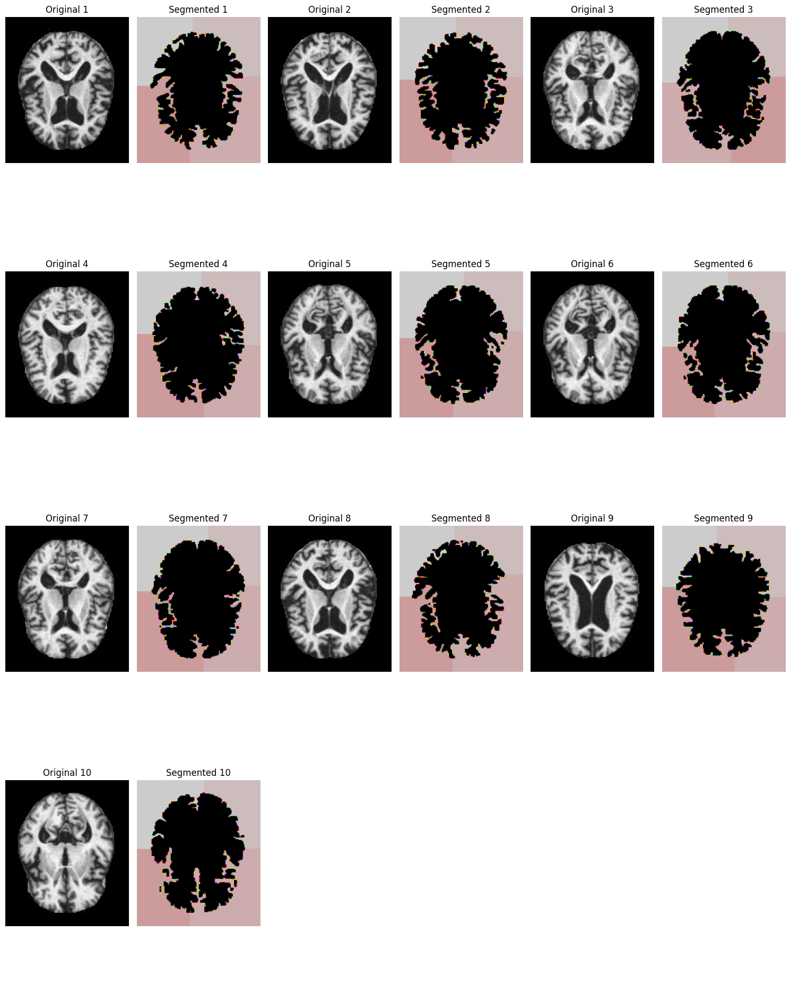

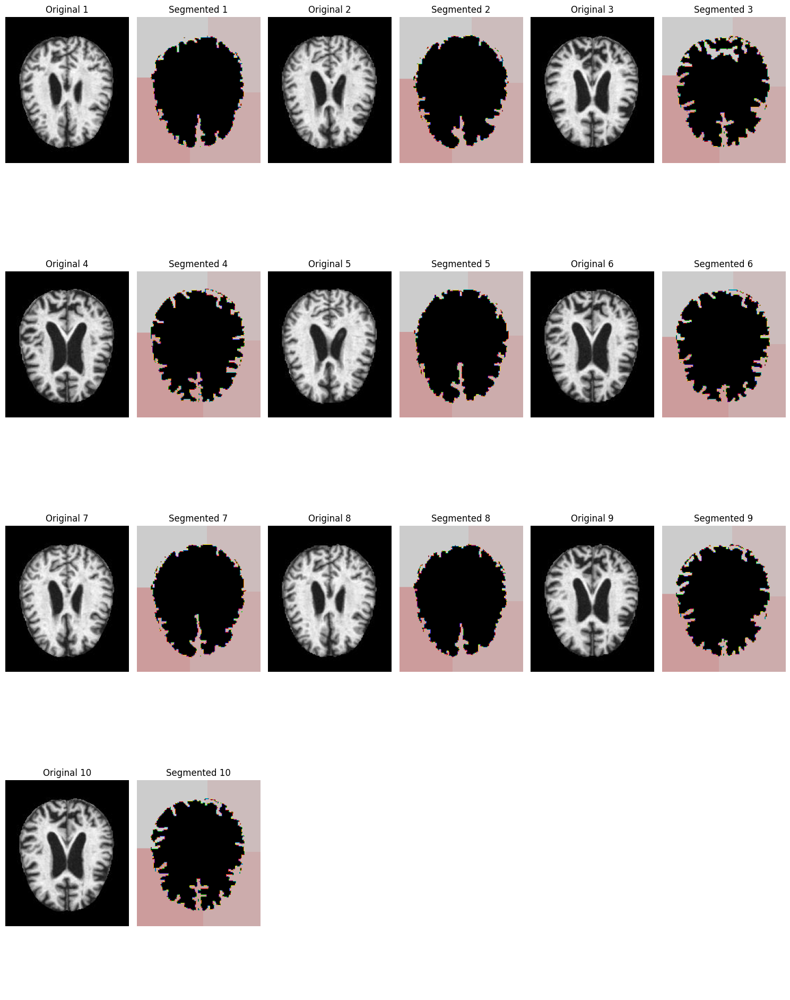

In [ ]:
import os
import numpy as np
import cv2
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation, opening, closing, square
from skimage import morphology
from skimage.segmentation import watershed
import matplotlib.pyplot as plt
from skimage.segmentation import watershed

def load_and_segment_images_from_folder(folder, morph_operation=None, complement=False, watershed_flag=False):
    original_images = []
    segmented_images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = imread(img_path)

        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Binarization using Otsu's threshold (skimage)
            thresh = threshold_otsu(gray_img)
            binary_img = gray_img > thresh

            # Apply morphological operation (using skimage)
            if morph_operation == 'erosion':
                processed_img = erosion(binary_img, square(3))
            elif morph_operation == 'dilation':
                processed_img = dilation(binary_img, square(3))
            elif morph_operation == 'opening':
                processed_img = opening(binary_img, square(3))
            elif morph_operation == 'closing':
                processed_img = closing(binary_img, square(3))
            else:
                processed_img = binary_img  # No morphological operation

            # Convert processed image back to uint8 for OpenCV
            processed_img_uint8 = (processed_img * 255).astype(np.uint8)

            # Apply Otsu's thresholding using OpenCV
            _, thresh_image = cv2.threshold(processed_img_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Complement the thresholded image
            if complement:
                thresh_image = cv2.bitwise_not(thresh_image)

            # Apply Watershed segmentation if needed
            if watershed_flag:
                # Compute the distance transform
                distance = cv2.distanceTransform(thresh_image, cv2.DIST_L2, 5)
                _, markers = cv2.threshold(distance, 0.7 * distance.max(), 255, 0)
                markers = np.uint8(markers)
                markers = morphology.label(markers)

                # Apply watershed
                watershed_img = watershed(-distance, markers, mask=thresh_image)

                # Convert watershed image to uint8 format for consistency
                watershed_img = (watershed_img * 255).astype(np.uint8)
                segmented_images.append(watershed_img)
            else:
                segmented_images.append(thresh_image)

            original_images.append(gray_img)  # Store original grayscale image

    return np.array(original_images), np.array(segmented_images)

# Function to display images with original and segmented versions
def display_images_with_segmentation(original_images, segmented_images, ncols=3, max_images=10):
    """ Display a limited number of original and segmented images in a grid with titles. """
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(original_images[i], cmap='gray')
        axs[2 * i].set_title(f"Original {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(segmented_images[i], cmap='nipy_spectral')
        axs[2 * i + 1].set_title(f"Segmented {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * i + 2, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Define directories
train_data_dir = '/content/dataset/Alzheimer_s Dataset/train'  # Replace with your path
test_data_dir = '/content/dataset/Alzheimer_s Dataset/test'    # Replace with your path

# Apply segmentation on training images with watershed
train_images_segmented = []
train_labels_segmented = []
original_train_images = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images = load_and_segment_images_from_folder(class_path, morph_operation='opening', complement=True, watershed_flag=True)
        original_train_images.extend(original_images)
        train_images_segmented.extend(segmented_images)
        train_labels_segmented.extend([class_folder] * len(segmented_images))

# Apply segmentation on test images with watershed
test_images_segmented = []
test_labels_segmented = []
original_test_images = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images = load_and_segment_images_from_folder(class_path, morph_operation='closing', complement=True, watershed_flag=True)
        original_test_images.extend(original_images)
        test_images_segmented.extend(segmented_images)
        test_labels_segmented.extend([class_folder] * len(segmented_images))

# Convert lists to numpy arrays
original_train_images = np.array(original_train_images)
train_images_segmented = np.array(train_images_segmented)
train_labels_segmented = np.array(train_labels_segmented)

original_test_images = np.array(original_test_images)
test_images_segmented = np.array(test_images_segmented)
test_labels_segmented = np.array(test_labels_segmented)

# Check the shape of the processed data
print("Train images shape after segmentation:", train_images_segmented.shape)
print("Train labels shape:", train_labels_segmented.shape)
print("Test images shape after segmentation:", test_images_segmented.shape)
print("Test labels shape:", test_labels_segmented.shape)

# Display a limited number of original and segmented training images
display_images_with_segmentation(original_train_images, train_images_segmented, ncols=3, max_images=10)

# Display a limited number of original and segmented test images
display_images_with_segmentation(original_test_images, test_images_segmented, ncols=3, max_images=10)


Train images shape after segmentation: (5121, 208, 176)
Train labels shape: (5121,)
Test images shape after segmentation: (1279, 208, 176)
Test labels shape: (1279,)


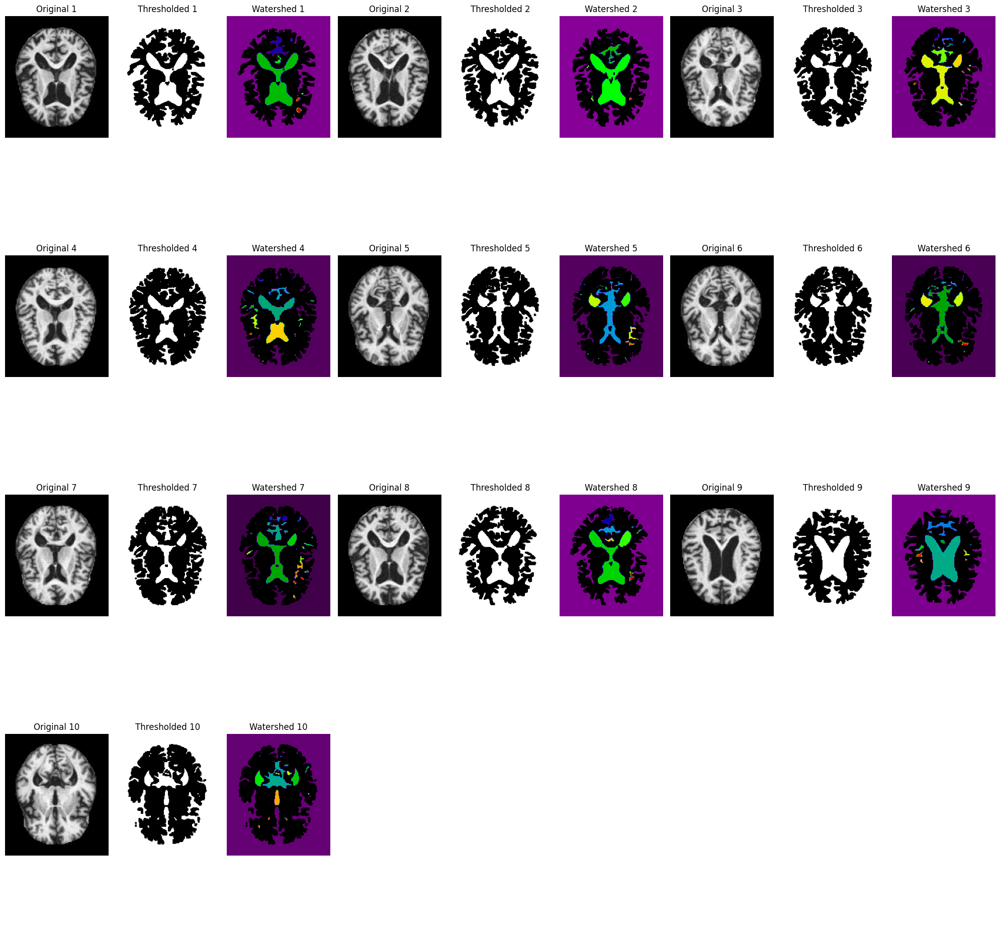

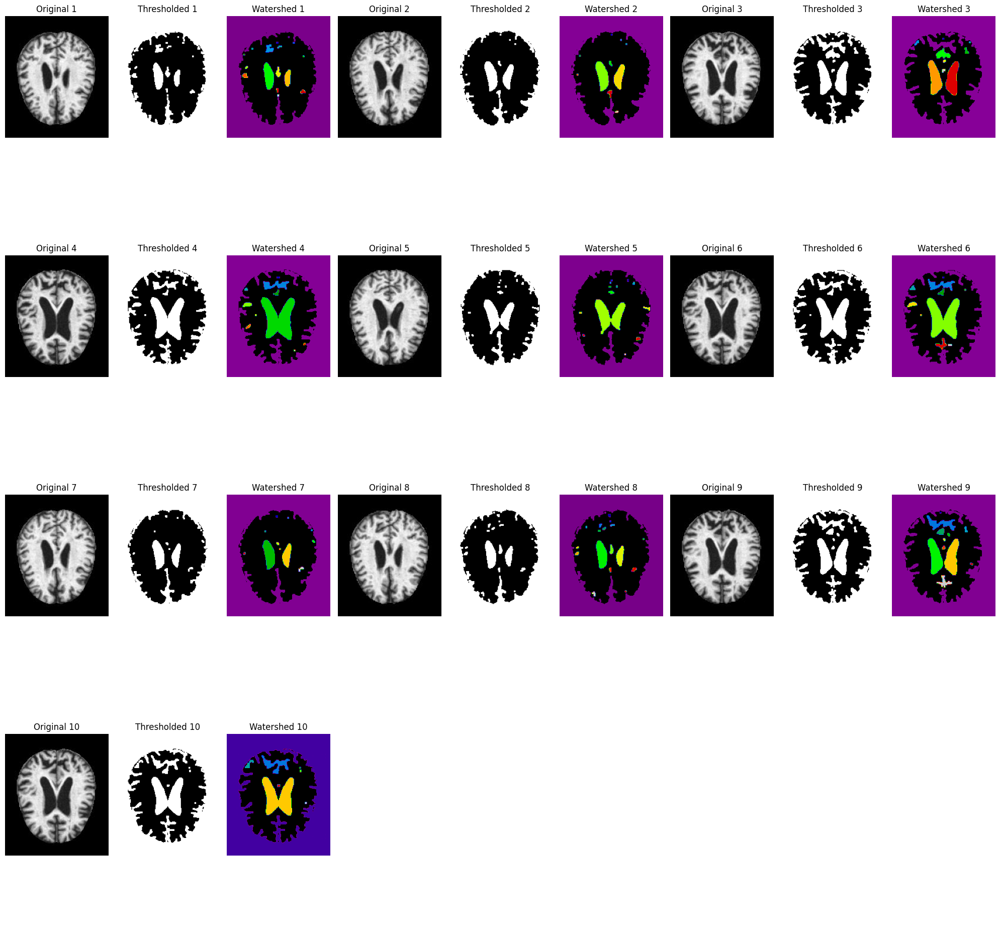

In [ ]:
import os
import numpy as np
import cv2
from skimage.io import imread
from skimage.color import rgb2gray
from skimage.filters import threshold_otsu
from skimage.morphology import erosion, dilation, opening, closing, square
from skimage import morphology
from skimage.segmentation import watershed
from scipy import ndimage as ndi
import matplotlib.pyplot as plt

# Function to load, convert to grayscale, binarize, apply morphological operations, apply Otsu's thresholding, and watershed segmentation
def load_and_segment_images_from_folder(folder, morph_operation=None, complement=False):
    original_images = []
    segmented_images = []
    watershed_images = []
    for filename in os.listdir(folder):
        img_path = os.path.join(folder, filename)
        img = imread(img_path)

        if img is not None:
            # Convert to grayscale if necessary
            if len(img.shape) == 3:
                gray_img = rgb2gray(img)
            else:
                gray_img = img

            # Binarization using Otsu's threshold
            thresh = threshold_otsu(gray_img)
            binary_img = gray_img > thresh

            # Apply morphological operation
            if morph_operation == 'erosion':
                processed_img = erosion(binary_img, square(3))
            elif morph_operation == 'dilation':
                processed_img = dilation(binary_img, square(3))
            elif morph_operation == 'opening':
                processed_img = opening(binary_img, square(3))
            elif morph_operation == 'closing':
                processed_img = closing(binary_img, square(3))
            else:
                processed_img = binary_img  # No morphological operation

            # Convert processed image back to uint8 for OpenCV
            processed_img_uint8 = (processed_img * 255).astype(np.uint8)

            # Apply Otsu's thresholding using OpenCV
            _, thresh_image = cv2.threshold(processed_img_uint8, 0, 255, cv2.THRESH_BINARY + cv2.THRESH_OTSU)

            # Complement the thresholded image
            if complement:
                thresh_image = cv2.bitwise_not(thresh_image)

            # Distance transform
            distance = ndi.distance_transform_edt(thresh_image)

            # Find local maxima as markers
            markers = ndi.label(distance)[0]

            # Watershed segmentation
            watershed_image = watershed(-distance, markers, mask=thresh_image)

            original_images.append(gray_img)  # Store original grayscale image
            segmented_images.append(thresh_image)
            watershed_images.append(watershed_image)
    return np.array(original_images), np.array(segmented_images), np.array(watershed_images)

# Function to display images with original, thresholded, and watershed versions
def display_images_with_watershed(original_images, thresholded_images, watershed_images, ncols=3, max_images=10):
    """ Display a limited number of original, thresholded, and watershed images in a grid with titles. """
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 3, figsize=(20, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[3 * i].imshow(original_images[i], cmap='gray')
        axs[3 * i].set_title(f"Original {i+1}")
        axs[3 * i].axis('off')

        axs[3 * i + 1].imshow(thresholded_images[i], cmap='gray')
        axs[3 * i + 1].set_title(f"Thresholded {i+1}")
        axs[3 * i + 1].axis('off')

        axs[3 * i + 2].imshow(watershed_images[i], cmap='nipy_spectral')
        axs[3 * i + 2].set_title(f"Watershed {i+1}")
        axs[3 * i + 2].axis('off')

    # Turn off any remaining axes
    for j in range(3 * i + 3, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Define directories
train_data_dir = '/content/dataset/Alzheimer_s Dataset/train'  # Replace with your path
test_data_dir = '/content/dataset/Alzheimer_s Dataset/test'    # Replace with your path

# Apply segmentation on training images
train_images_segmented = []
train_labels_segmented = []
original_train_images = []
train_watershed_images = []
for class_folder in os.listdir(train_data_dir):
    class_path = os.path.join(train_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images, watershed_images = load_and_segment_images_from_folder(class_path, morph_operation='opening', complement=True)
        original_train_images.extend(original_images)
        train_images_segmented.extend(segmented_images)
        train_watershed_images.extend(watershed_images)
        train_labels_segmented.extend([class_folder] * len(segmented_images))

# Apply segmentation on test images
test_images_segmented = []
test_labels_segmented = []
original_test_images = []
test_watershed_images = []
for class_folder in os.listdir(test_data_dir):
    class_path = os.path.join(test_data_dir, class_folder)
    if os.path.isdir(class_path):
        original_images, segmented_images, watershed_images = load_and_segment_images_from_folder(class_path, morph_operation='closing', complement=True)
        original_test_images.extend(original_images)
        test_images_segmented.extend(segmented_images)
        test_watershed_images.extend(watershed_images)
        test_labels_segmented.extend([class_folder] * len(segmented_images))

# Convert lists to numpy arrays
original_train_images = np.array(original_train_images)
train_images_segmented = np.array(train_images_segmented)
train_labels_segmented = np.array(train_labels_segmented)
train_watershed_images = np.array(train_watershed_images)

original_test_images = np.array(original_test_images)
test_images_segmented = np.array(test_images_segmented)
test_labels_segmented = np.array(test_labels_segmented)
test_watershed_images = np.array(test_watershed_images)

# Check the shape of the processed data
print("Train images shape after segmentation:", train_images_segmented.shape)
print("Train labels shape:", train_labels_segmented.shape)
print("Test images shape after segmentation:", test_images_segmented.shape)
print("Test labels shape:", test_labels_segmented.shape)

# Display a limited number of original, thresholded, and watershed training images
display_images_with_watershed(original_train_images, train_images_segmented, train_watershed_images, ncols=3, max_images=10)

# Display a limited number of original, thresholded, and watershed test images
display_images_with_watershed(original_test_images, test_images_segmented, test_watershed_images, ncols=3, max_images=10)


/usr/local/lib/python3.10/dist-packages/sklearn/cluster/_kmeans.py:1416: FutureWarning: The default value of `n_init` will change from 10 to 'auto' in 1.4. Set the value of `n_init` explicitly to suppress the warning
  super()._check_params_vs_input(X, default_n_init=10)


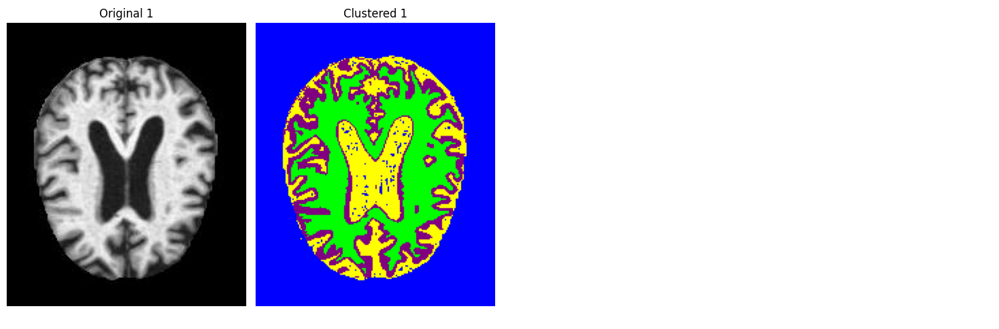

In [ ]:
import numpy as np
import cv2
from sklearn.cluster import KMeans
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

def apply_kmeans_clustering(image, n_clusters=4):
    # Convert the image to grayscale if it is not already
    if len(image.shape) == 3:
        gray_img = rgb2gray(image)
    else:
        gray_img = image

    # Flatten the image into a 1D array for clustering
    flat_img = gray_img.flatten().reshape(-1, 1)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(flat_img)

    # Map each pixel to the cluster's mean intensity
    clustered = kmeans.labels_.reshape(gray_img.shape)

    # Create a color map for the clusters (4 contrasting colors)
    color_map = np.array([
        [0, 0, 255],    # Blue
        [0, 255, 0],    # Green
        [128, 0, 128],  # Purple
        [255, 255, 0]   # Yellow
    ])

    # Convert the clustered image to RGB using the color map
    clustered_colored = color_map[clustered]

    return clustered_colored

def display_images_with_clustering(original_images, clustered_images, ncols=2, max_images=10):
    """Display a limited number of original and clustered images in a grid with titles."""
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(original_images[i], cmap='gray')
        axs[2 * i].set_title(f"Original {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(clustered_images[i])
        axs[2 * i + 1].set_title(f"Clustered {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * n_images, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Load sample images (update with your own image paths)
image_paths = [
    '/content/dataset/Alzheimer_s Dataset/test/MildDemented/26 (19).jpg',
    # Add paths to more images here
]

original_images = [imread(path) for path in image_paths]
clustered_images = [apply_kmeans_clustering(img) for img in original_images]

# Display the original and clustered images
display_images_with_clustering(original_images, clustered_images)


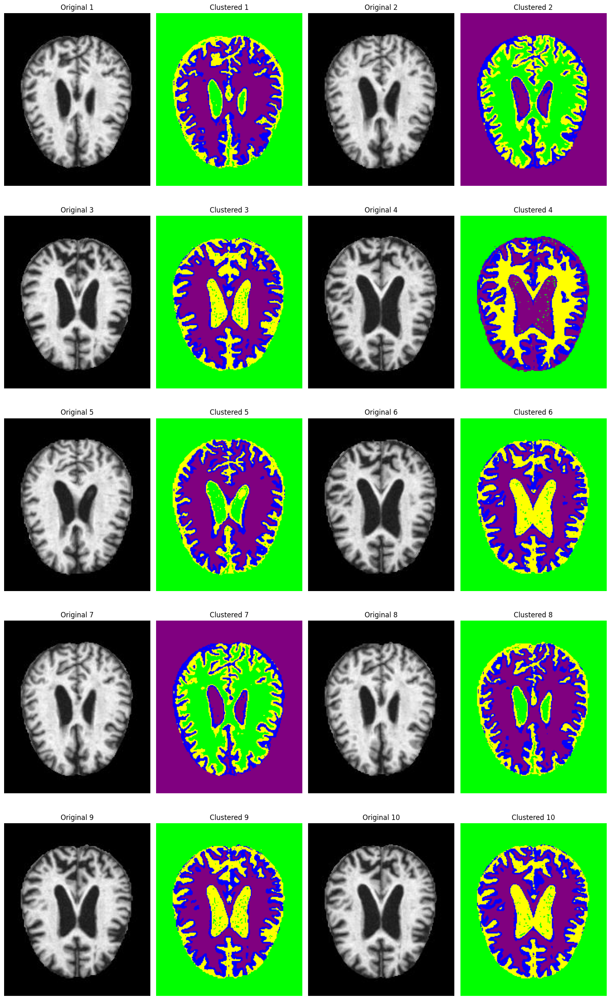

In [ ]:
import os
import numpy as np
import cv2
from sklearn.cluster import KMeans
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

def apply_kmeans_clustering(image, n_clusters=4):
    # Convert the image to grayscale if it is not already
    if len(image.shape) == 3:
        gray_img = rgb2gray(image)
    else:
        gray_img = image

    # Flatten the image into a 1D array for clustering
    flat_img = gray_img.flatten().reshape(-1, 1)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(flat_img)

    # Map each pixel to the cluster's label
    clustered = kmeans.labels_.reshape(gray_img.shape)

    # Create a color map for the clusters (4 contrasting colors)
    color_map = np.array([
        [0, 0, 255],    # Blue
        [0, 255, 0],    # Green
        [128, 0, 128],  # Purple
        [255, 255, 0]   # Yellow
    ])

    # Convert the clustered image to RGB using the color map
    clustered_colored = color_map[clustered]

    return clustered_colored

def display_images_with_clustering(original_images, clustered_images, ncols=2, max_images=10):
    """Display a limited number of original and clustered images in a grid with titles."""
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(original_images[i], cmap='gray')
        axs[2 * i].set_title(f"Original {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(clustered_images[i])
        axs[2 * i + 1].set_title(f"Clustered {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * n_images, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Load images from the specified directory automatically
train_data_dir = '/content/dataset/Alzheimer_s Dataset/test'
image_paths = []

# Traverse through all files in the directory
for root, _, files in os.walk(train_data_dir):
    for file in files:
        if file.endswith(('.jpg', '.jpeg', '.png')):  # Load only common image file types
            image_paths.append(os.path.join(root, file))

# Read images and apply clustering
original_images = [imread(path) for path in image_paths]
clustered_images = [apply_kmeans_clustering(img) for img in original_images]

# Display the original and clustered images
display_images_with_clustering(original_images, clustered_images)


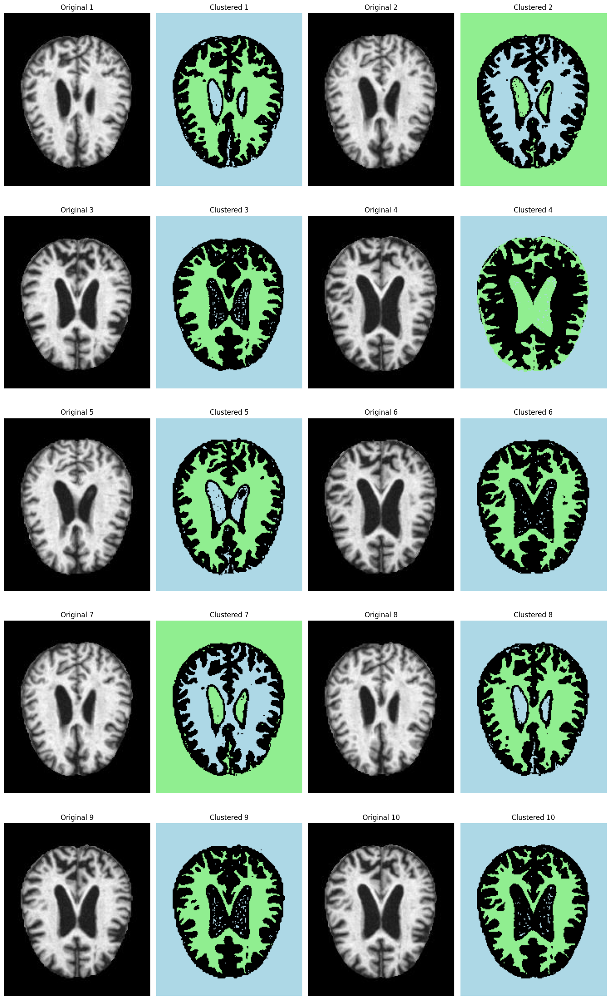

In [ ]:
import os
import numpy as np
import cv2
from sklearn.cluster import KMeans
from skimage.io import imread
from skimage.color import rgb2gray
import matplotlib.pyplot as plt

def apply_kmeans_clustering(image, n_clusters=4):
    # Convert the image to grayscale if it is not already
    if len(image.shape) == 3:
        gray_img = rgb2gray(image)
    else:
        gray_img = image

    # Flatten the image into a 1D array for clustering
    flat_img = gray_img.flatten().reshape(-1, 1)

    # Apply K-Means clustering
    kmeans = KMeans(n_clusters=n_clusters, random_state=0)
    kmeans.fit(flat_img)

    # Map each pixel to the cluster's label
    clustered = kmeans.labels_.reshape(gray_img.shape)

    # Create a color map: black for background, light green, and blue for interior
    color_map = np.array([
        [0, 0, 0],      # Black
        [173, 216, 230],  # Light blue
        [144, 238, 144],  # Light green
        [0, 0, 0]       # Black (if needed for other clusters)
    ])

    # Convert the clustered image to RGB using the color map
    clustered_colored = color_map[clustered]

    return clustered_colored

def display_images_with_clustering(original_images, clustered_images, ncols=2, max_images=10):
    """Display a limited number of original and clustered images in a grid with titles."""
    n_images = min(len(original_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(original_images[i], cmap='gray')
        axs[2 * i].set_title(f"Original {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(clustered_images[i])
        axs[2 * i + 1].set_title(f"Clustered {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * n_images, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Load images from the specified directory automatically
train_data_dir = '/content/dataset/Alzheimer_s Dataset/test'
image_paths = []

# Traverse through all files in the directory
for root, _, files in os.walk(train_data_dir):
    for file in files:
        if file.endswith(('.jpg', '.jpeg', '.png')):  # Load only common image file types
            image_paths.append(os.path.join(root, file))

# Read images and apply clustering
original_images = [imread(path) for path in image_paths]
clustered_images = [apply_kmeans_clustering(img) for img in original_images]

# Display the original and clustered images
display_images_with_clustering(original_images, clustered_images)


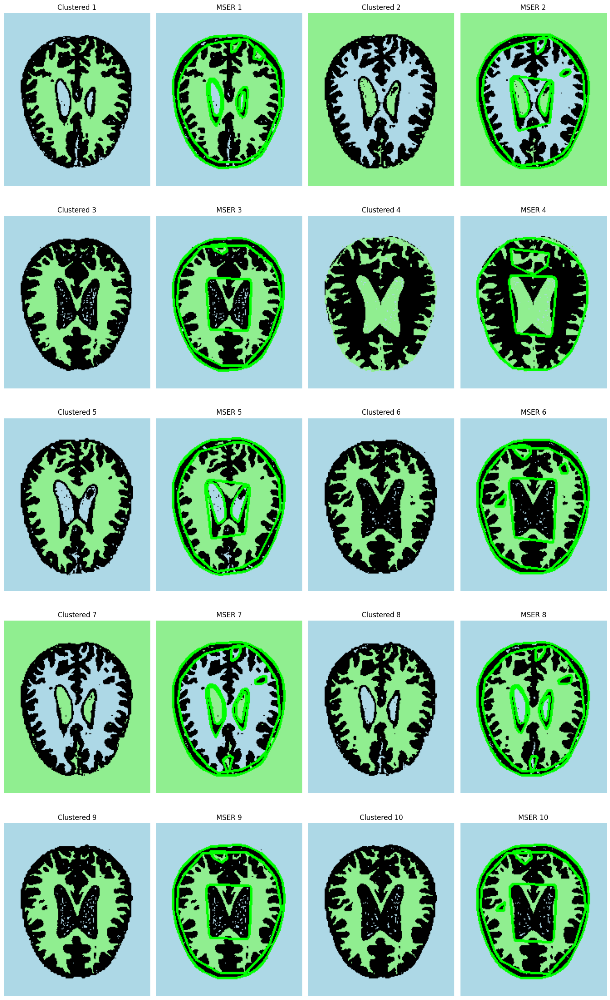

In [ ]:
import cv2
import numpy as np
import matplotlib.pyplot as plt

def apply_mser(image):
    # Convert to grayscale if needed (OpenCV MSER works on single-channel images)
    if len(image.shape) == 3 and image.shape[2] == 3:
        # Convert image to uint8 (required by OpenCV functions)
        image_uint8 = image.astype(np.uint8)
        gray_image = cv2.cvtColor(image_uint8, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image

    # Initialize MSER detector
    mser = cv2.MSER_create()

    # Detect regions in the image
    regions, _ = mser.detectRegions(gray_image)

    # Create a copy of the image to draw the regions
    mser_image = np.copy(image_uint8)

    # Draw the detected regions on the image
    for region in regions:
        hull = cv2.convexHull(region.reshape(-1, 1, 2))
        cv2.polylines(mser_image, [hull], True, (0, 255, 0), 2)  # Green contour

    return mser_image

# Apply MSER on the clustered images
mser_images = [apply_mser(img) for img in clustered_images]

# Display the original clustered images with MSER regions
def display_mser_images(clustered_images, mser_images, ncols=2, max_images=10):
    n_images = min(len(clustered_images), max_images)
    n_rows = (n_images + ncols - 1) // ncols
    fig, axs = plt.subplots(n_rows, ncols * 2, figsize=(15, 5 * n_rows))
    axs = axs.ravel()

    for i in range(n_images):
        axs[2 * i].imshow(clustered_images[i])
        axs[2 * i].set_title(f"Clustered {i+1}")
        axs[2 * i].axis('off')

        axs[2 * i + 1].imshow(mser_images[i])
        axs[2 * i + 1].set_title(f"MSER {i+1}")
        axs[2 * i + 1].axis('off')

    # Turn off any remaining axes
    for j in range(2 * n_images, len(axs)):
        axs[j].axis('off')

    plt.tight_layout()
    plt.show()

# Display the MSER results
display_mser_images(clustered_images, mser_images)


In [ ]:
pip install scikit-image opencv-python

In [ ]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import matplotlib.pyplot as plt

# MSER Region Count
def calculate_mser_count(image):
    if len(image.shape) == 3 and image.shape[2] == 3:
        gray_image = cv2.cvtColor(image, cv2.COLOR_RGB2GRAY)
    else:
        gray_image = image
    mser = cv2.MSER_create()
    regions, _ = mser.detectRegions(gray_image)
    return len(regions)

# PSNR: Peak Signal-to-Noise Ratio
def calculate_psnr(image1, image2):
    if len(image1.shape) == 3:
        image1_gray = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
    else:
        image1_gray = image1
    if len(image2.shape) == 3:
        image2_gray = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)
    else:
        image2_gray = image2
    return peak_signal_noise_ratio(image1_gray, image2_gray)

# SSIM: Structural Similarity Index Measure
def calculate_ssim(image1, image2):
    if len(image1.shape) == 3:
        image1_gray = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
    else:
        image1_gray = image1
    if len(image2.shape) == 3:
        image2_gray = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)
    else:
        image2_gray = image2
    ssim_value, _ = structural_similarity(image1_gray, image2_gray, full=True)
    return ssim_value

# NCC: Normalized Cross-Correlation
def calculate_ncc(image1, image2):
    if len(image1.shape) == 3:
        image1_gray = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
    else:
        image1_gray = image1
    if len(image2.shape) == 3:
        image2_gray = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)
    else:
        image2_gray = image2
    norm_image1 = (image1_gray - np.mean(image1_gray)) / np.std(image1_gray)
    norm_image2 = (image2_gray - np.mean(image2_gray)) / np.std(image2_gray)
    return np.mean(norm_image1 * norm_image2)

# NAE: Normalized Absolute Error
def calculate_nae(image1, image2):
    if len(image1.shape) == 3:
        image1_gray = cv2.cvtColor(image1, cv2.COLOR_RGB2GRAY)
    else:
        image1_gray = image1
    if len(image2.shape) == 3:
        image2_gray = cv2.cvtColor(image2, cv2.COLOR_RGB2GRAY)
    else:
        image2_gray = image2
    return np.sum(np.abs(image1_gray - image2_gray)) / np.sum(image1_gray)

# Process all images and calculate metrics
mser_counts = []
psnr_values = []
ssim_values = []
ncc_values = []
nae_values = []

for original_img, mser_img in zip(original_images, mser_images):
    mser_count = calculate_mser_count(mser_img)
    psnr = calculate_psnr(original_img, mser_img)
    ssim = calculate_ssim(original_img, mser_img)
    ncc = calculate_ncc(original_img, mser_img)
    nae = calculate_nae(original_img, mser_img)

    mser_counts.append(mser_count)
    psnr_values.append(psnr)
    ssim_values.append(ssim)
    ncc_values.append(ncc)
    nae_values.append(nae)

# Display the results
for i, (mser_count, psnr, ssim, ncc, nae) in enumerate(zip(mser_counts, psnr_values, ssim_values, ncc_values, nae_values)):
    print(f"Image {i+1} - MSER Count: {mser_count}, PSNR: {psnr:.2f}, SSIM: {ssim:.4f}, NCC: {ncc:.4f}, NAE: {nae:.4f}")

# Example dementia stage evaluation based on MSER counts
def evaluate_dementia_stage(mser_count):
    if mser_count < 1:  # Adjust the thresholds as needed
        return "Non-Demented"
    elif 2 <= mser_count < 5:
        return "Very Mild Demented"
    elif 6 <= mser_count < 18:
        return "Mild Demented"
    elif 19 <= mser_count < 35:
        return "Moderate Demented"
    else:
        return "Late Stage"

# Evaluate the dementia stage based on MSER counts
dementia_stages = [evaluate_dementia_stage(count) for count in mser_counts]

# Display the dementia stage results
for i, stage in enumerate(dementia_stages):
    print(f"Image {i+1} - Dementia Stage: {stage}")


Image 1 - MSER Count: 22, PSNR: 4.03, SSIM: 0.1410, NCC: -0.2808, NAE: 0.9673
Image 2 - MSER Count: 31, PSNR: 4.33, SSIM: 0.1358, NCC: -0.2128, NAE: 1.0517
Image 3 - MSER Count: 27, PSNR: 4.13, SSIM: 0.1368, NCC: -0.2177, NAE: 1.0441
Image 4 - MSER Count: 22, PSNR: 2.74, SSIM: -0.1285, NCC: -0.9062, NAE: 1.5631
Image 5 - MSER Count: 32, PSNR: 4.10, SSIM: 0.1228, NCC: -0.2683, NAE: 0.9478
Image 6 - MSER Count: 25, PSNR: 4.23, SSIM: 0.1406, NCC: -0.2241, NAE: 1.0930
Image 7 - MSER Count: 26, PSNR: 4.29, SSIM: 0.1378, NCC: -0.2215, NAE: 1.0010
Image 8 - MSER Count: 24, PSNR: 4.04, SSIM: 0.1385, NCC: -0.2787, NAE: 0.9474
Image 9 - MSER Count: 26, PSNR: 4.17, SSIM: 0.1399, NCC: -0.2154, NAE: 1.0684
Image 10 - MSER Count: 27, PSNR: 4.19, SSIM: 0.1390, NCC: -0.2222, NAE: 1.0676
Image 11 - MSER Count: 31, PSNR: 4.28, SSIM: 0.1375, NCC: -0.2264, NAE: 1.1271
Image 12 - MSER Count: 25, PSNR: 12.55, SSIM: 0.5289, NCC: 0.7783, NAE: 0.6441
Image 13 - MSER Count: 25, PSNR: 3.95, SSIM: 0.0886, NCC: -0

In [ ]:
import cv2
import numpy as np
from skimage.metrics import peak_signal_noise_ratio, structural_similarity
import matplotlib.pyplot as plt
import pandas as pd  # Import pandas for DataFrame

# (Your existing functions here: calculate_mser_count, calculate_psnr, calculate_ssim, calculate_ncc, calculate_nae)

# Process all images and calculate metrics
mser_counts = []
psnr_values = []
ssim_values = []
ncc_values = []
nae_values = []

for original_img, mser_img in zip(original_images, mser_images):
    mser_count = calculate_mser_count(mser_img)
    psnr = calculate_psnr(original_img, mser_img)
    ssim = calculate_ssim(original_img, mser_img)
    ncc = calculate_ncc(original_img, mser_img)
    nae = calculate_nae(original_img, mser_img)

    mser_counts.append(mser_count)
    psnr_values.append(psnr)
    ssim_values.append(ssim)
    ncc_values.append(ncc)
    nae_values.append(nae)

# Create a DataFrame for the results
results_df = pd.DataFrame({
    'Image': [f'Image {i+1}' for i in range(len(mser_counts))],
    'MSER Count': mser_counts,
    'PSNR': psnr_values,
    'SSIM': ssim_values,
    'NCC': ncc_values,
    'NAE': nae_values
})

# Example dementia stage evaluation based on MSER counts
def evaluate_dementia_stage(mser_count):
    if mser_count < 1:  # Adjust the thresholds as needed
        return "Non-Demented"
    elif 2 <= mser_count < 5:
        return "Very Mild Demented"
    elif 6 <= mser_count < 18:
        return "Mild Demented"
    elif 19 <= mser_count < 35:
        return "Moderate Demented"
    else:
        return "Late Stage"

# Evaluate the dementia stage based on MSER counts
dementia_stages = [evaluate_dementia_stage(count) for count in mser_counts]
results_df['Dementia Stage'] = dementia_stages

# Display the results as a table
print(results_df)

# Optionally, you can also save the results to a CSV file
results_df.to_csv('dementia_evaluation_results.csv', index=False)


           Image  MSER Count      PSNR      SSIM       NCC       NAE  \
0        Image 1          22  4.029790  0.140955 -0.280797  0.967291   
1        Image 2          31  4.325132  0.135818 -0.212832  1.051735   
2        Image 3          27  4.134022  0.136771 -0.217707  1.044111   
3        Image 4          22  2.744538 -0.128519 -0.906236  1.563140   
4        Image 5          32  4.095727  0.122808 -0.268319  0.947775   
...          ...         ...       ...       ...       ...       ...   
1274  Image 1275          34  4.048781  0.121886 -0.287456  1.005465   
1275  Image 1276          20  3.744252 -0.017509 -0.672271  1.835597   
1276  Image 1277          33  3.501225 -0.050007 -0.592408  1.495018   
1277  Image 1278          33  3.351573 -0.029917 -0.670003  1.487856   
1278  Image 1279          29  4.257841  0.120910 -0.278427  1.703323   

         Dementia Stage  
0     Moderate Demented  
1     Moderate Demented  
2     Moderate Demented  
3     Moderate Demented  
4    

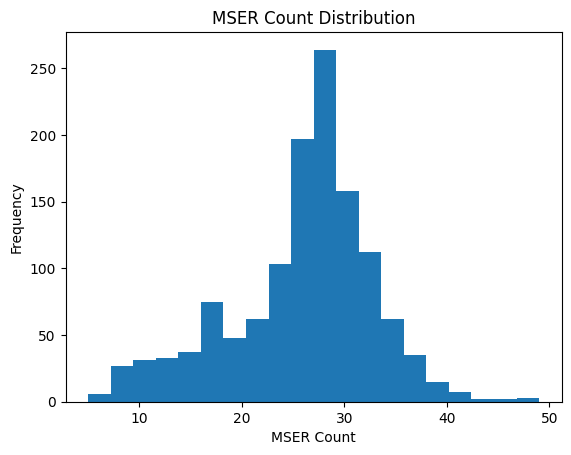

In [ ]:
plt.hist(mser_counts, bins=20)
plt.xlabel("MSER Count")
plt.ylabel("Frequency")
plt.title("MSER Count Distribution")
plt.show()
